In [1]:
# MIT License
#
#@title Copyright (c) 2023 CCAI Community Authors { display-mode: "form" }
#
# Permission is hereby granted, free of charge, to any person obtaining a
# copy of this software and associated documentation files (the "Software"),
# to deal in the Software without restriction, including without limitation
# the rights to use, copy, modify, merge, publish, distribute, sublicense,
# and/or sell copies of the Software, and to permit persons to whom the
# Software is furnished to do so, subject to the following conditions:
#
# The above copyright notice and this permission notice shall be included in
# all copies or substantial portions of the Software.
#
# THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR
# IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY,
# FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL
# THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER
# LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING
# FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER
# DEALINGS IN THE SOFTWARE.

# CCAI Tutorial: Agile Modeling for Bioacoustic Monitoring

Authors (Equal Contribution):
*   Jenny Hamer, Google DeepMind, hamer@google.com
*   Rob Laber, Google Cloud, roblaber@google.com
*   Tom Denton, Google Research, tomdenton@google.com

An interactive tutorial (requires user engagement) that demonstrates analyzing an unlabeled bioacoustic dataset for a target species given a vocalization of that species to help provide insights for ecologists, conservationists, land managers, and other domain experts. We achieve this by leveraging a [high-quality, bioacoustic pre-trained model](https://tfhub.dev/google/bird-vocalization-classifier/4), searching over the unlabeled corpus conditioned on a single species example, and applying an efficient ML technique to produce matches.

Tutorial at NeurIPS 2023 Workshop [Tackling Climate Change with ML](https://nips.cc/virtual/2023/workshop/66543). View the poster [here](https://drive.google.com/file/d/1-FHYqaY4Y0vA0P3lvcyINFDFlKWuKMw4/view?usp=drive_link).

# Table of Contents


<!-- *   [Data Hosting & Package Installs](#data-installs) -->
*   [Overview](#overview)
  - [Glossary](#glossary)
  - [Bioacoustics and Biodiversity](#bio_and_bio)
  - [Agile Modeling for Bioacoustics](#agile_modeling)
*   [Climate Impact](#climate-impact)
*   [Target Audience](#target-audience)
*   [Software Requirements](#software-requirements)
*   [Data Description](#data-description)
*   [Methodology](#methodology)
  - [Embed the Search Dataset](#embed_data)
  - [Audio Similarity Search](#similarity-search)
  - [Active Learning](#active-learning)
*   [Discussion](#discussion)
*   [References](#references)


<a name="overview"></a>
# Overview

The goal of this tutorial is to demonstrate the use of an **active learning** technique to produce an audio classifier for a novel task.

At a high level, active learning (aka "agile modeling") can be described as the process of bootstrapping dataset annotation by making use of an existing model, and then training a new classifier based on the bootstrapped dataset. The technique relies on a **human-in-the-loop workflow** to extract and produce a small subset of annotated data from the unlabeled dataset, which can then be used as training data for downstream tasks. Our workflow is particularly useful in situations where:
* You would like to generate a custom classification model for a specialized task where you may not have enough labeled data to train a model from scratch
* You have access to an existing model (or dataset to train a model) that performs an adjacent task.

<a name=glossary></a>
## Glossary

We provide a high-level, intuitive description of some of the core machine learning concepts utilized and presented in this tutorial.

### Agile Modeling

Agile modeling in the context of supervised machine learning can be described as “the process of turning any subjective visual concept into a computer vision model through real-time user-in-the-loop interactions” ([Stretcu et al. 2023](https://arxiv.org/abs/2302.12948)). In our setting, we go beyond the typical image and computer vision settings to explore the audio domain, where **we transform a single labeled audio sample of a species vocalization into a bioacoustic classifier.**



### Transfer Learning

Transfer learning is a technique that relies on the reuse of a pre-trained model on a new task (different dataset from which it was trained). This technique assumes that the pre-training of the model produces a useful representation and knowledge that can be extended to the new task/setting. In the context of this tutorial, we use a model pre-trained on a large acoustic dataset of bird vocalizations (Xeno-Canto, focal recordings) to produce embeddings of a new soundscape dataset (passive recordings).


**Intuition:** in the context of avian bioacoustics, transfer learning is useful for building a general representation that can translate to specific species or geographical regions, particularly when labeled data is scarcer. Using a pre-trained model with transfer learning lowers the machine learning overhead for field experts and practitioners who seek to understand and interpret unlabeled data, such as that from passive acoustic monitoring (PAM).

### Active Learning

Active Learning is a general term for an iterative, supervised ML technique that efficiently makes use of labeled data to “learn the labels” or classify unlabeled data. This learning setting is particularly helpful in scenarios where unlabeled data is abundant and producing labels for that data is costly, requires expert knowledge, lots of manual work, etc.

### Embeddings

At their core, neural networks function by learning new representations of data that help make the underlying patterns in the dataset more obvious.  These representations are called **embeddings**.  Concretely, an embedding is a point (or vector) in a high dimensional space.  Data points with embeddings that are close to each other are likely to share salient traits.

<a name=bio_and_bio></a>

## Bioacoustics and Biodiversity

Listening is a fantastic way to understand an ecosystem. An extremely broad collection of animals use sound to communicate--from owls to orcas, from bats to bonobos--which provides us with the opportunity to listen in and learn what animals are in an ecosystem.

We can also learn about the relationships between different animals: alarm calls indicate the presence of silent predators, and can even [contain clues about what kinds of predators are nearby](https://www.washington.edu/news/2005/06/23/chickadees-alarm-calls-carry-information-about-size-threat-of-predator/). We can measure how vocalizations change in response to differences in the natural environment (elevation, temperature, [geographic location](https://www.smithsonianmag.com/science-nature/do-birds-have-language-180979629), seasonality) or in response to human interventions (restoration programs, logging, proximity to highways, etc.).

The insights we gain from bioacoustic analysis can help understand the impact of interventions, and inform decisions for conservation. Bioacoutics is actively used for:
* [Finding, tracking, and protecting threatened and endangered species](https://www.birds.cornell.edu/ccb/picking-up-good-vibrations-for-elephant-conservation/)
* [Quantifying broad biodiversity](https://academic.oup.com/condor/article/124/2/duac003/6572065)
* [Understanding species population health](https://conbio.onlinelibrary.wiley.com/doi/10.1111/csp2.72)
* [Understanding ecosystem health](https://www.frontiersin.org/articles/10.3389/fevo.2021.706445/full)
* [Identifying destructive+illegal human activities](https://www.fastcompany.com/90435386/this-network-of-microphones-listens-for-the-chainsaws-of-illegal-loggers-in-the-rainforest)
* [Early detection and response to invasive species](https://connormwood.com/spotted-owl-conservation/)

...and more! Projecting forward, we also expect bioacoustics to play an increasing role in the assessment of areas to protect for the [30-by-30](https://en.wikipedia.org/wiki/30_by_30) initiative, as well as in assessments for [biodiversity credits](https://www.weforum.org/agenda/2022/12/biodiversity-credits-nature-cop15/) and [corporate responsibility initiatives](https://www.sustainability.nespresso.com/birdsong-sound-of-sustainability).

Thanks to the broad range of vital applications and wide availability of cheap recording devices, bioacoustic surveys are steadily growing in size and scope: [one ongoing study](https://www.damonlesmeister.com/pnw-bioacoustics.html) in the Northwestern US deployed over 5,000 microphones in the summer of 2023. Meanwhile, the [Australian Acoustic Observatory](https://acousticobservatory.org/) has collected over 2 million hours of audio from across the continent in just a couple years since its launch. And there are massive efforts to monitor marine mammals and coral reefs: the [SanctSound](https://www.ncei.noaa.gov/news/sanctsound-studying-underwater-world-sound) project gathered over 500TB of data between 2018 and 2022.

**However, there are challenges!**

Bioacoustic surveys can generate thousands or even millions of hours of audio, far more than experts could ever listen to. As a result, we require machine learning tools which mulitply the efforts of these experts. These tools must also allow us to work with staggering amounts of audio data efficiently.

Additionally, new problems are appearing all the time: no single classifier is going to cover all the bases. There are thousands of species for which we don't have sufficient training data for traditional ML classifier training, especially in tropical areas where biodiversity is the greatest. Furthermore, we are often concerned with different types of vocalizations. If we can differentiate between juvenile and adult calls, we can measure a population's reproductive health efficiently. In other cases, different calls can help determine if an endangered species is nesting in an area (requiring a high degree of protection) or simply passing through the area. Needless to say, training data for these highly-specific problems often simply does not exist.

As a result, training a single mega-classifier is not enough: We require flexible tooling which can capture new kinds of insights efficiently.


<a name=agile_modeling></a>
## Agile Modeling for Bioacoustics

The core problem this tutorial addresses lies in biodiversity monitoring using large-scale, unlabeled audio data, as collected by inexpensive passive acoustic monitoring (PAM) devices. We present an **integrated workflow** for analyzing large unlabeled bioacoustic datasets, adapting new [agile modeling techniques](https://arxiv.org/abs/2302.12948) to the audio domain. The tools we provide enable users to adapt a classifier for a novel class (species, specific call type, etc...) with minimal overhead.

Our goal is to **allow experts to create classifiers for new sounds in less than an hour.**

The overall flow has three main parts:
* First, we use a high-quality *embedding model* to produce embeddings of a large unlabeled dataset, such as a conservation organization might collect. This produces a large table of embeddings, which can be easily joined back to the original audio. (For large datasets, this step may take a substantial amount of time, but only needs to be done once: All later steps make use of these precomputed embeddings.)

* Next, we use audio similarity search to sift through the unlabeled dataset embeddings for sounds of interest. The user provides a query—an example of a sound category they are searching for, like a juvenile call for a particular species—which is also embedded, and we present the user with the most relevant dataset elements according to their embeddings' similarity to the query embedding. The user marks the retrieved dataset elements as relevant or irrelevant, which provides training data for the next step.
   
  - The similarity search over embeddings allows us to find similar audio examples, even when there is some variation, vocalizations are quiet, or there are overlapping sounds.
  
  - In the example below, we are able to find relevant examples of hairy woodpecker drumming sounds (blue) even in the presence of competing sounds (brown).  The [spectrogram](https://en.wikipedia.org/wiki/Spectrogram) on the left is a known
  vocalization of a hairy woodpecker.  The similarity search algorithm allows us to detect instances of this vocalizations in an audio context that may have
  other background noise (the three spectrograms on the right, with background noise indicated in brown):
  > ![search](https://docs.google.com/drawings/d/e/2PACX-1vSIwCEkHNEjtyh3PLhTa-4hTTaBoMnWGVXobr91rKeD7m52a4ES9K0JZ_tqltasUWctgLHnf2PrvtKU/pub?w=371&h=253)
  


* The final step is to use the training data obtained in the previous step as part of an active learning loop to train a classifier for the user's search query. During each iteration of the loop, we fit a simple classifier onto the training data. We use the trained classifier along with margin sampling to efficiently surface 'hard' examples that are then rated by the user as relevant or irrelevant to their query. Finally, the newly-rated data is added to the training data for the next iteration of the active learning loop. The fact that embeddings are only computed once on the unlabeled dataset means that each iteration of the loop is very fast to carry out.

The core of this process is a high-quality model for bioacoustic data. [We have shown](https://arxiv.org/pdf/2307.06292.pdf) that the embeddings from our [global bird classification model](https://tfhub.dev/google/bird-vocalization-classifier/4) transfer efficiently to novel bioacoustic problems - including bird call-types, bats, and marine mammals - outperforming general audio foundation models. Additionally, because we work with precomputed embeddings, the classifiers are very quick to train and to apply to the unlabeled dataset.

For example, here's a t-SNE projection of embeddings from a call-type dataset with five classes (each color corresponds to a single class). On this dataset, we can exceed 0.95 ROC-AUC using only four training examples per class, significantly outperforming AudioMAE, YamNet, and VGGish.

> ![search](https://drive.google.com/uc?id=1w2z-WlVtR2k2tNxzgb174O1QIp96nW81)

This well-separated embedding space lends itself to classification in novel bioacoustic tasks, and is also excellent for audio similarity search.

<a name="climate-impact"></a>
# Climate Impact

As climate change rapidly alters short-term weather patterns and longer-term trajectories – along with contributing to more widespread and frequent extreme weather events – these changes can significantly harm natural ecosystems, habitats, and the species that call them home, endangering biodiversity. According to the [California Dept. of Fish and Wildlife](https://wildlife.ca.gov/Science-Institute/Climate-Biodiversity-Monitoring), studying biodiversity can provide insights into potential links between climate change and its effects on local ecosystems and species. Beyond the increased understanding into the current state of climate change, these insights can help inform on-going and future risks to local species, biodiversity, and adaptive decision-making for species protection and land management.

Some studies have found that healthy ecosystems better suppress carbon. As an example, recent work from [Pearson et al. 2022, University of Alaska Southeast](https://www.cell.com/trends/ecology-evolution/fulltext/S0169-5347(22)00279-8) indicates that restoring whale populations will enhance carbon storage in whale biomass and carbon sequestration via nutrient provisioning.

The [rising temperatures in Hawaii](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC5218566/#:~:text=Avian%20malaria%20is%20strongly%20influenced,potential%20extinction%20of%20highly%20susceptible) have allowed invasive mosquitos to encroach on the remaining natural habitat of native birds susceptible to avian malaria, highlighting the complexity of the biodiversity and climate change relationship.

<a name=target-audience></a>
# Target Audience

This tutorial is designed to serve two main audiences:
* ML practitioners interested in exploring the application of ML techniques to problems related to bioacoustics and biodiversity monitoring.
* Field experts in areas such as ecology, land management, biodiversity monitoring, ornithology, etc. with some basic background in machine learning seeking new tools to process bioacoustic datasets given known species of interest.

<a name="software-requirements"></a>
# Software Requirements

The majority of the code is contained in a publicly accessible repository hosted on github: https://github.com/google-research/perch.

**Note:** This repository was formerly named 'chirp', so any references to 'chirp' in the code below are references to code in this Perch repository.

The Perch codebase contains a variety of processing and machine learning tooling for working with audio datasets, with a focus on avian acoustics.  This tutorial demonstrates only some of the functionality provided by the Perch codebase.  **Therefore, there are section of this tutorial where we ask the reader to configure default values that are targeted to this specific use case and tutorial.  In order to keep this tutorial focused, we will selectively discuss only the most relevant parameters, and we refer the reader to the github repository for more background and context.**

To use this tutorial, we rely on the off-the-shelf Google Colab runtime (Python 3 Google Compute Engine backend). This has the majority of the required packages already installed and meet the version requirements. If you are using this, then **no action is required**. Packages include:
* python, version 3.10+
* NumPy, version 1.2+
* Tensorflow, version 2+
* [tqdm](https://tqdm.github.io/), version 4.6+

You should be able to use any of the three free provided backends available as of Fall 2023 (CPU, T4 GPU, or TPU).

## Install the `perch` codebase from GitHub

**Important:** Restart the Colab runtime after install completes.

In [2]:
# Note: This occasionally breaks due to changes in the Colab environment.
# If broken, please email tomdenton@google.com and/or hamer@google.com.
# !pip install git+https://github.com/google-research/perch.git@e27e95344c84601759d4d881289a1c2b53697fa6

## Load the required imports


Beyond the `perch` package pip-installed in the cell above, all other required libraries are already either covered within that installation or already installed in the default Python 3 Google Compute Engine backend/runtime.

We note again that any `chirp` modules are provided by the Perch code.

<a name="data-description"></a>
# Data Description

The main goal of this notebook is to demonstrate the Active Learning technique.  In order to best illustrate the technique, we will use some specific datasets that are tailored to a specific goal.  However, we encourage the reader to keep in mind that the specifics of the dataset(s) and our chosen Machine Learning goal in this notebook are just for illustrative purposes.  The Active Learning technique is broadly applicable for analysis of novel datasets across diverse domains and fields.

In this tutorial we will use two datasets.  The first, [Xeno Canto](https://xeno-canto.org/), is a large, open source, annotated corpus of thousands of audio samples covering a broad swath of the global avian species.  This dataset was used to train a bird classier that predicts a species for a given vocalization.  We highlight that this model was trained without any specific learning task in mind (beyond the generic species classification).  This model is used to generate the embeddings that were discussed above.


The second dataset is called [Powdermill](https://zenodo.org/record/4656848#.Y7ijhOxudhE).  It is an open-sourced, **soundscape** (ie, passively recorded) dataset collected from the Powdermill Nature Reserve in Pennsylvania, USA, consisting of many hours of **unlabeled** audio recordings containing high activity "dawn chorus" avian vocalizations.

The goal of this tutorial is to show how to use the general purpose bird classifier model (trained on Xeno Canto) to analyze a novel unlabeled audio corpus.

<a name="data-hosting"></a>
## Data Hosting in Google Drive

To facilitate easy "plug-and-play" and reduce overhead requirements, we have hosted the data and pre-trained model used in a publicly accessible Google Drive folder.

To make sure that your copy of the Colab is connected to the Drive, please create a shortcut to this folder in your MyDrive:
- navigate to the shared data [Google Drive folder](https://drive.google.com/drive/folders/1LjVh15pCeyUs2G163AjRYGFOCVAFi3Hr)
- click the dropdown menu labeled `CCAI 2023 Google Perch Tutorial Shared Data`
- select `Organize` -> `Add shortcut`.

![step 0](https://drive.google.com/uc?id=1hNMitJ9IqnL882e6S-m_VETF6lFRN7w0)

![step 1](https://drive.google.com/uc?id=1aiIGLFIjjxZXDvKmkw2vyUTYY6H9-6Yn)

![step 2](https://drive.google.com/uc?id=1DOqT95tTErmKljaLHEdo--tGodzEPqaU)


#### Mount Drive to access the files stored in Drive in this Colab

Upon executing the cell below, a pop-up show appear that requires authorization to connect Drive. Approve this and then continue below.

**IMPORTANT:** This tutorial will write data back in your personal Google Drive.  Please make sure that the `drive_output_directory` variable below does not collide with any existing folders in your Google Drive.

In [3]:
# The necessary pipeline to connect this Colab environment with the Google Drive
# folder where we host the data used in this tutorial.
import os
# from google.colab import drive

# drive.mount('/content/drive', force_remount=True)

# # If you followed the above instructions for creating a shortcut to the shared
# # Drive folder, you should be able to navigate to this directory in the left
# # hand "Files" menu in this Colab (indicated by the Folder icon on the far left
# # menu).
# drive_shared_data_folder = '/content/drive/My Drive/CCAI 2023 Google Perch Tutorial Shared Data/'
shared_data_folder = '/Users/lviotti/Library/CloudStorage/Dropbox/Work/Kitzes/projects/active-learning-nb/CCAI 2023 Google Perch Tutorial Shared Data/'

# # This is the location that this tutorial will use to save data.
# drive_output_directory = '/content/drive/My Drive/CCAI 2023 Google Perch Tutorial Outputs/'
output_directory = '/Users/lviotti/Library/CloudStorage/Dropbox/Work/Kitzes/projects/active-learning-nb/CCAI 2023 Google Perch Tutorial Outputs/'

if not os.path.exists(output_directory):
  os.mkdir(output_directory)

<a name="methodology"></a>
# Methodology

This section contains the main content of this notebook.

As mentioned above, the goal of this notebook is to demonstrate the Active Learning technique to analyze unlabeled acoustic datasets.  **To illustrate the technique, we will play the role of an ecologist seeking to understand vocalization patterns of a specific species, the [Wood Thrush](https://ebird.org/species/woothr) (_Hylocichla mustelina_), in the Powdermill Nature Reserve in the eastern United States.**  In particular, we have *hundreds of hours* of audio data collected from the Powdermill Nature Reserve, and we want to know how many Wood Thrush vocalizations we can detect. Sorting through all of this audio manually would take weeks or months.

![wood_thrush](https://drive.google.com/uc?id=106SGB3utHbknocxFs3zBVRrnSQn-3SCC)
**A Wood Thrush.**

Medium-sized thrush with a large, round white belly covered in brown spots. Sings a flutelike clear song from understory and canopy perches.
(Image source: All About Birds [Macaulay Library photogallery](https://www.allaboutbirds.org/guide/Wood_Thrush/photo-gallery/170865401))



## Overview

Our method performs a **vector search**: given a **labeled** vocalization which we'll refer to as a **query** (an audio clip with a known species vocalizing), an unlabeled audio dataset which we'll refer to as our **search corpus** (in our case, a soundscape dataset from the Powdermill Nature Reserve), slice up the search corpus into a collection of clips and search over that corpus to find "matches" with the query.

To do this, we'll follow theses high level steps:

**Step 1:** Use the generic "off the shelf" bird classification model to generate embeddings for the unlabeled **search corpus** (ie the Powdermill dataset).

**Step 2:** Obtain one or two **query** samples, which are labeled samples of the target species (in our case, the Wood Thrush). We can find known audio samples of the Wood Thrush in Cornell's [eBird dataset](https://ebird.org/species/woothr#:~:text=Top%20audio).

**Step 3:** Generate the embedding(s) corresponding to the query sample.

**Step 4:** Search within the set of embeddings generated from the search corpus (the raw Powdermill audio) for points that are "nearby" the embedding generated from the query sample. This yields a set of audio snippets from the Powdermill audio that should sound similar to the known Wood Thrush call.

**Step 5:** Manually audit the results of step 4. This involves listening to the samples and manually tagging them with the species that are present in that audio snippet.

--------------------
**Note:** We will repeat steps 4 and 5 until we have 20-30 samples for each species in question. We are "bootstrapping" a training set for a simple linear model.

--------------------
**Step 6:** Train a simple linear model based on the bootstrapped samples that we just generated.

At this point, we have what should be a high quality classifier that can detect the Wood Thrush in the Powdermill dataset. If our model is not performing as well as we'd like, we can continue to generate more training data by repeating steps 4 and 5, or we can also use our linear model to surface new points.



This section is broken down into the following parts:
*    [Setup and Configuration](#pipeline-config)
*    [Generate Embeddings](#embed_data) (Steps 1, 2, and 3)
*    [Audio Similarity Search](#similarity-search) (Steps 4 and 5)
*    [Train a Linear Classifier](#active-learning) (Step 6)



<a name="pipeline-config"></a>
## Setup and Configuration

In this section, we set the configuration parameters we'll be using to process and embed the audio data, along with input and output paths for reading in the data, pre-trained model, and writing the results we produce to file.

In [4]:
# Import various dependencies, including the relevant modules from the Perch
# repository. Note that "chirp" is the old name that the Perch team used, so any
# chirp modules imported here were installed as part of the Perch repository in
# one of the previous cells.

import collections
from etils import epath
from IPython.display import HTML
import matplotlib.pyplot as plt
from ml_collections import config_dict
import numpy as np
from scipy.io import wavfile
import tensorflow as tf
import tqdm

# from chirp.inference import colab_utils
# colab_utils.initialize(use_tf_gpu=True, disable_warnings=True)

from chirp import audio_utils
from chirp import config_utils
from chirp import path_utils
from chirp.inference import embed_lib
from chirp.inference import models
from chirp.inference import tf_examples
from chirp.models import metrics
from chirp.inference.search import bootstrap
from chirp.inference.search import search
from chirp.inference.search import display
from chirp.inference.classify import classify
from chirp.inference.classify import data_lib

# Gambiarrinha pra rodar o modelo: https://stackoverflow.com/questions/71153492/invalid-argument-error-graph-execution-error
from tensorflow.keras.optimizers.legacy import Adam


# We should see a GPU in the list of devices, if connected to a Colab GPU.
tf.config.list_physical_devices()

[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU')]

### Set the configuration to use throughout the tutorial **[do not change]**

**To the reader: unless you are adapting this pipeline to your own model or dataset, you can skip the details in this section.**

As mentioned above, the Perch codebase provides a general framework for agile modeling, which naturally involves many different configuration options.  We highlight some of the relevant paramers below, and refer the reader to the Perch
codebase for more detail.

For this tutorial using the provided pre-trained model and datasets, the required values for the following parameters are fixed and should not be changed.

**Note** that we will also save the configuration to file to support reproducibility (e.g. in the event we wish to work with the embeddings at a later point).

#### Relevant Parameters
* `window_size_s`: The size in seconds of each "chunk" of audio.  Each chunk of audio will be treated like
 a single data point.  5 second chunks work well for bird vocalizations.  Note
 that the model architecture depends on this value, so once selected it cannot be changed.

* `hop_size_s`: The hop size (aka model [*stride*](https://medium.com/machine-learning-algorithms/what-is-stride-in-convolutional-neural-network-e3b4ae9baedb)) is the offset in seconds between successive
 chunks of audio. When hop_size is equal to window size, the chunks of audio
 will not overlap at all. Choosing a smaller `hop_size_s` may be useful for capturing interesting data points that
 correspond to audio on the boundary between two windows. However, a smaller
 hop size may also lead to a larger embedding dataset because each instant of
 audio is now pesent in multiple windows. As a consequence, you might need to
 "de-dupe" your matches since multiple embedded data points may borreopnd to
 the same snippet of raw audio.

* `sample_rate`: We use a uniform sample rate of 32 kHz. All audio used for training the base model and generating embeddings is (re)sampled at 32 kHz. This parameter, together with the `window_size_s` of 5 means that each snippet of audio gets represented as a vector of length 5s * 32,000Hz = 160,000.  The value 160,000 must be compatible with your model architecture.

In [5]:
# Model specific parameters: PLEASE DO NOT CHANGE THE CODE IN THIS CELL.
config = config_dict.ConfigDict()
embed_fn_config = config_dict.ConfigDict()
embed_fn_config.model_key = 'taxonomy_model_tf'
model_config = config_dict.ConfigDict()

# The size of each "chunk" of audio.
model_config.window_size_s = 5.0

# The hop size (aka model 'stride') is the offset in seconds between successive
# chunks of audio. When hop_size is equal to window size, the chunks of audio
# will not overlap at all. Choosing a smaller hop_size (a common choice is half
# of the window_size) may be useful for capturing interesting data points that
# correspond to audio on the boundary between two windows. However, a smaller
# hop size may also lead to a larger embedding dataset because each instant of
# audio is now pesent in multiple windows. As a consequence, you might need to
# "de-dupe" your matches since multiple embedded data points may borreopnd to
# the same snippet of raw audio.
model_config.hop_size_s = 5.0

# All audio in this tutorial is resampled to 32 kHz.
model_config.sample_rate = 32000

# The location of the pre-trained model.
model_config.model_path = shared_data_folder + 'bird-vocalization-classifier/'

# Only write embeddings to reduce size. The Perch codebase supports serializing
# a variety of metadata along with the embeddings, but for the purposes of this
# tutorial we will not need to make use of those features.
embed_fn_config.write_embeddings = True
embed_fn_config.write_logits = False
embed_fn_config.write_separated_audio = False
embed_fn_config.write_raw_audio = False

config.embed_fn_config = embed_fn_config
embed_fn_config.model_config = model_config

# We have functionality to break large inputs up into smaller chunks;
# this is especially helpful for dealing with long files or very large datasets.
# get in touch if you think you may need this.
config.shard_len_s = -1
config.num_shards_per_file = -1

# Number of parent directories to include in the filename. This allows us to
# provess raw audio that lives in multiple directories.
config.embed_fn_config.file_id_depth = 1

# Number of TFRecord files to create.
config.tf_record_shards = 1

### Specify the data (inputs) and results (outputs) directories

You do not need to change these values for this tutorial - the values already specified should map to the provided shared data hosted in Google Drive, and will map to a folder in your local Drive.

To execute this pipeline, we need paths to:
- `unlabeled_audio_pattern`: the file within Drive where the unlabeled audio dataset is stored.
- `embedding_output_dir`: the directory where the embedded audio will be written.
- `labeled_data_path`: the directory where the labeled samples will be placed post-search and active learning loop.

In [6]:
# Specify a glob pattern matching any number of .wav files.
# This can look like '/path/to/audio/*.wav'
# For the purposes of a quick demo, we'll work with a subset of the full
# Powdermill dataset.  This allows us to understand how the embedding step works
# without having to embed the entire dataset (which can take a while).
unlabeled_audio_pattern = shared_data_folder + 'Powdermill Embeddings/Recording_4/Recording_4_Segment_2*.wav' #@param

# Specify a directory where the embeddings will be written.
embedding_output_dir = output_directory + 'raw_embeddings/' #@param

config.output_dir = embedding_output_dir
config.source_file_patterns = [unlabeled_audio_pattern]

# Create output directory and write the configuration.
output_dir = epath.Path(config.output_dir)
output_dir.mkdir(exist_ok=True, parents=True)

# The path to an empty directory where the generated labeled samples will be
# placed. Each labeled sample will be placed into a subdirectory corresponding
# to the target class that we select for that sample.
labeled_data_path = output_directory + 'labeled_outputs/'  #@param

### Write the configuration to JSON to ensure consistency with later stages of the pipeline

In [7]:
# This dumps a config json file next to the embeddings that allows us to reuse
# the same embeddings and ensure that we have the correct config that was used
# to generate them.
embed_lib.maybe_write_config(config, output_dir)

# Create SourceInfos configuration, used in sharded computation when computing
# embeddings.  These source_infos contain metadata about how we're going to
# partition the search corpus.  In particular, we're splitting the Powdermill
# audio into hundreds of 5s chunks, and the source_infos help us with the
# keep track of which chunk came from which raw audio file.
source_infos = embed_lib.create_source_infos(
    config.source_file_patterns,
    config.num_shards_per_file,
    config.shard_len_s)
print(f'Constructed {len(source_infos)} source infos.')

Constructed 7 source infos.


### Load the pre-trained embedding model

We will apply *transfer learning* by using a model pre-trained on an avian bioacoustics dataset ([Xeno-Canto](xeno-canto.org)) to compute the embeddings we will search over. This pre-trained model allows us to leverage a rich learned representation so that we do not need to train a custom model for the specific species we search for.

The pre-trained model that we use is (open-sourced and available on [TFHub](https://tfhub.dev/google/bird-vocalization-classifier/4)).

In [8]:
# Here we're loading our generic Bird Classifier model.
# The embed_fn object is a wrapper over the model.
embed_fn = embed_lib.EmbedFn(**config.embed_fn_config)
print('\n\nLoading model(s)...')
embed_fn.setup()

print('\n\nTest-run of model...')
z = np.zeros([int(model_config.sample_rate * model_config.window_size_s)])
embed_fn.embedding_model.embed(z)
print('Setup complete!')



Loading model(s)...


Test-run of model...


2024-06-13 15:31:21.411599: W tensorflow/compiler/tf2xla/kernels/assert_op.cc:38] Ignoring Assert operator jax2tf_infer_fn_/assert_equal_1/Assert/AssertGuard/Assert
I0000 00:00:1718307082.642294       1 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.
2024-06-13 15:31:22.651274: E external/local_xla/xla/stream_executor/stream_executor_internal.h:177] SetPriority unimplemented for this stream.


Setup complete!


<a name=embed_data></a>
## Generate Embeddings

In this section we'll generate the **embeddings** corresponding to both our search corpus (the unlabeled Powdermill audio) as well as our query audio (the known Wood Thrush sample).

Recall that the embeddings are new representations of the original data that are generated by the generic model.  It is important to remember that we are **not** using the our generic model to classify the Powdermill corpus.  Rather, we're using the model's **learned features** to map our data into a new representation that is more amenable to simpler classification techniques. The idea is that the generic model has already done the heavy lifting of learning the salient features from scratch.  We can then make use of these features for a different task.  This is the concept of **transfer learning**, ie, re-using the features learned by a model, but in a novel setting.

### Process the search dataset

In [9]:
# To reduce the overhead computational resources required and speed up execution
# time, we use multiple threads to load the audio before embedding. This tends
# to perform faster, but can fail if any audio files are corrupt.

# The source_infos variable contains metadata about how to parition the search
# corpus.  This step creates an audio_iterator which iterates over the 5 second
# chunks of audio.
embed_fn.min_audio_s = 1.0
record_file = (output_dir / 'embeddings.tfrecord').as_posix()
succ, fail = 0, 0

audio_iterator = audio_utils.multi_load_audio_window(
    filepaths=[s.filepath for s in source_infos],
    offsets=[s.shard_num * s.shard_len_s for s in source_infos],
    sample_rate=model_config.sample_rate,
    window_size_s=config.shard_len_s,
)

### Embed the search dataset

We are ready to generate the embeddings for the raw audio.  This cell iterates over the `audio_iterator` created in the previous cell and creates a point (vector) in *embedding space* for each 5 second chunk of raw audio.  We write these embeddings to files (which are written into your `emebdding_output_dir` directory that we specified above), and then return a `ds` variable that is a handle on the resulting TFRecordDataset object.

Writing the embeddings to file is useful because for large datasets, this embedding step can take minutes or hours, and we don't want to have to repeatedly regenerate the embeddings.

**Note:** For the purposes of this tutorial, we're only generating embeddings for a small subset of the full Powdermill corpus (it would take too long to process the whole corpus).  However, we have pre-computed the embeddings for the whole dataset and placed them in the shared Drive folder.  In a later step
you will be able to use this much larger search corpus to more fully explore the Powdermill dataset.

In [10]:
# This step may take a few minutes to run.

with tf_examples.EmbeddingsTFRecordMultiWriter(
    output_dir=output_dir, num_files=config.tf_record_shards) as file_writer:
  for source_info, audio in tqdm.tqdm(
      zip(source_infos, audio_iterator), total=len(source_infos)):
    if audio.shape[0] < embed_fn.min_audio_s * model_config.sample_rate:
      # Ignore short audio.
      continue
    file_id = source_info.file_id(config.embed_fn_config.file_id_depth)
    offset_s = source_info.shard_num * source_info.shard_len_s
    example = embed_fn.audio_to_example(file_id, offset_s, audio)
    if example is None:
      fail += 1
      continue
    file_writer.write(example.SerializeToString())
    succ += 1
  file_writer.flush()
print(f'\n\nSuccessfully processed {succ} source_infos, failed {fail} times.')

fns = [fn for fn in output_dir.glob('embeddings-*')]
ds = tf.data.TFRecordDataset(fns)
parser = tf_examples.get_example_parser()
ds = ds.map(parser)
for ex in ds.as_numpy_iterator():
  print('Recording filename:', ex['filename'])
  print('Shape of the embedding:', ex['embedding'].shape)
  break

100%|██████████| 7/7 [01:12<00:00, 10.36s/it]



Successfully processed 7 source_infos, failed 0 times.
Recording filename: b'Recording_4/Recording_4_Segment_22.wav'
Shape of the embedding: (60, 1, 1280)


<a name=similarity-search></a>
## Audio Similarity Search

In the previous section we generated a set of embeddings for our search corpus as well as for our Wood Thrush query.  In this section we will 'search' within the search corpus to find examples that are similar to our query, and we'll manually label each sample as 'Wood Thrush' or 'Unknown'.  These labeled samples then get saved and will be used as training data for the linear classifier in the next section.

Recall that an *embedding* is simply a vector (point) in some high dimensional space.  The similarity search we implement relies of Euclidean distance between two vectors. Other metrics can be used to compare two vectors, such as cosine similarity or Maximum Inner Product (MIP).

**Note:** In practice, we end up looping through this section repeatedly with different query samples (if we have them) and different search parameters.  That helps us generate a robust training set.

### Define the target classes

We specify the classes (aka labels) that we want to search for within the search corpus. In our case, we're primariy interested in finding instances of the Wood Thrush vocalization, so our classes are "Wood Thrush" and "Unknown", where "unknown" will be used for anything that is not a Wood Thrush.

We note here that these classes are completely arbitrary. The Active Learning technique is *extremely* flexible and can be adapted to a wide variety of use cases. For example, the Perch team recently applied this technique to identify specific types of vocalizations for a single target species. In that case, we simply added the classes of interest to this `target_classes` list.

In [11]:
target_classes = ['Wood Thrush', 'Unknown'] #@param

#### Nature detour: a glance at the Wood Thrush

In [12]:
HTML('<iframe src="https://macaulaylibrary.org/asset/471755/embed" height="506" width="640" frameborder="0" allowfullscreen></iframe>')

/Users/lviotti/Applications/anaconda3/envs/agile-al/lib/python3.10/site-packages/IPython/core/display.py:431: UserWarning: Consider using IPython.display.IFrame instead
  warnings.warn("Consider using IPython.display.IFrame instead")


### Prepare the query vector

We're now ready to create the 'query', which uses a known Wood Thrush vocalization.  In general, this query is the audio that you're looking for in your search corpus.

As mentioned above, there are massive repositories of avian vocalizations available for download from [eBird.org](https://www.ebird.org) or [Xeno-Canto](https://xeno-canto.org/).

This audio snippets are visualized as [spectrograms](https://en.wikipedia.org/wiki/Spectrogram), which are a common way to display time-series data.

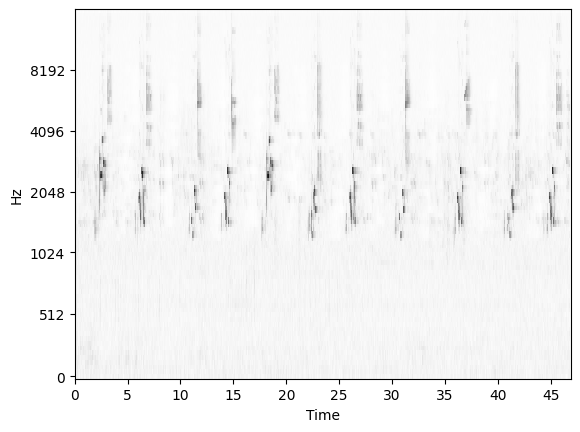

In [13]:
#@title Load the query audio sample

# Point to a local audio file, which in our case will be a pre-selected sample
# of a Wood Thrush vocalization.  The Perch codebase also supports loading
# directly from Xeno-Canto by simply specifying the Xeno-Canto id (like
# 'xc12345').
audio_path = shared_data_folder + 'XC771930-Wood Thrush.mp3'  #@param

audio = audio_utils.load_audio(audio_path, model_config.sample_rate)

# Display the full file.
display.plot_audio_melspec(audio, model_config.sample_rate)

#### Select the specific query window

The full audio sample in the previous cell might be longer than 5 seconds, so we need to find a specific window within the full clip to use (recall we're always working with 5 second audio samples).  Listen to the audio output above and find a 5 second window with a nice, clear vocalization, and note the elapsed time in seconds.

Selected audio window:


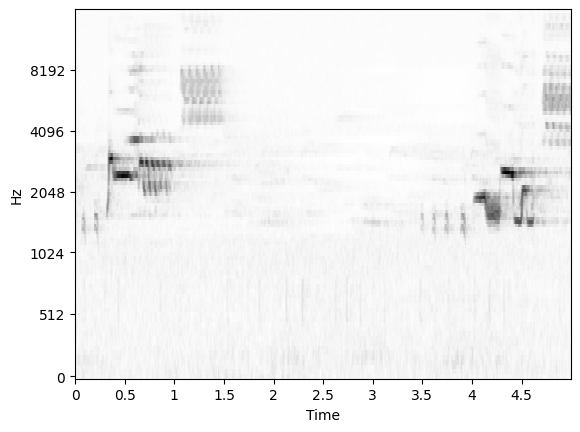

In [14]:
# The downloaded audio sample might be longer than 5 seconds, which is the
# length required in order to generate the embedding for the query.
# Mess around with manual selection of the query start time.  A value of 2 works
# well for the XC771930-Wood Thrush file.
start_s = 2  #@param

# Display the selected window.
print('Selected audio window:')
st = int(start_s * model_config.sample_rate)
end = int(st + model_config.window_size_s * model_config.sample_rate)
if end > audio.shape[0]:
  end = audio.shape[0]
  st = max([0, int(end - model_config.window_size_s * model_config.sample_rate)])
audio_window = audio[st:end]
display.plot_audio_melspec(audio_window, model_config.sample_rate)

query_audio = audio_window
sep_outputs = None

#### Embed the query

Here we run the query audio through the embedding function to generate the embedding vector for the query.

While it isn't a requirement for this tutorial, depending on the quality of the source audio, we can add in an additional preprocessing step using **sound separation**. In particular, [it's been shown](https://arxiv.org/abs/2110.03209) that unsupervised sound separation can help improve bird classification by automatedly reducing the presence of overlapping vocalizations, background noise, etc. to increase the signal-to-noise ratio (SNR).

In [15]:
query = query_audio

embedded_query = embed_fn.embedding_model.embed(query).embeddings[ :, 0, :]

### Create a TensorFlow Dataset (TFDS) wrapper over the embeddings

This is a technical step that wraps our search corpus in a TFDS object to allow us to use some convenient built-in features.

If you would like to utilize the larger search corpus from the whole Powdermill dataset, set the `embeddings_dir` variable to
`drive_shared_data_folder + 'powdermill/'`.  If you would like to first use the
smaller search corpus that you generated above, you can come back to this cell later and re-run this cell with the updated `embeddings_dir` and all subsequent cells.

In [32]:
#@title Refresh pre-computed embeddings

use_precomputed_embeddings = True # @param {type:"boolean"}
if use_precomputed_embeddings:
  # Use the embeddings from the entire Powdermill dataset.
  # This dataset contains a much larger number of embeddings,
  # so it might be more interesting to explore.
  embeddings_dir = shared_data_folder + 'Powdermill Embeddings/'
else:
  # Use the embedded dataset that we created above...
  embeddings_dir = embedding_output_dir

bootstrap_config = bootstrap.BootstrapConfig.load_from_embedding_config(
    embeddings_path=embeddings_dir,
    annotated_path=labeled_data_path
)

project_state = bootstrap.BootstrapState(
    bootstrap_config, embedding_model=embed_fn.embedding_model)

# GAMBIARRA da boa!
project_state.config.audio_globs = ['/Users/lviotti/Library/CloudStorage/Dropbox/Work/Kitzes/projects/active-learning-nb/CCAI 2023 Google Perch Tutorial Shared Data/Powdermill Embeddings/*/*.wav']

project_state = bootstrap.BootstrapState(
    bootstrap_config, embedding_model=embed_fn.embedding_model)

embeddings_ds = project_state.create_embeddings_dataset()

### <a name=top-k-search></a>Run top-k search using a comparison metric

In this cell we run a "nearest neighbor" search over the search corpus to find embeddings that are closest to the query embedding according to our chosen metric.  These will correspond to snippets of Powdermill audio that sound similar to our Wood Thrush query.

The `target_score` variable is a param that allows us to surface not just the closest matches, but rather matches that lie some fixed distance away.  When `target_score` is set to `None` (or `0`), the search will return the closest matches.

Recall that our goal in this section is to generate training data for a linear classifier. In order to train a robust model, we want this training dataset to contain both obvious/easy examples as well as not-so-obvious examples. If in our search we just looked for the closest possible matches, we would likely only find easy examples. The `target_score` param allows us to look for examples that might be less obvious (because they are farther away in embedding space).

**Important note:** You will likely need to come back to this cell and produce more top-k instances by modulating the value of `target_score`. We explain the approach to choosing useful values for `target_score` in the section [Choose a target score...'](#choosing-target-score).

In [35]:
# Number of search results to capture.
top_k = 10 # @param {type:"number"}

# The Perch codebase supports:
#  'euclidean', which is the standard euclidean distance
#  'cosine', which is the cosine similarity,
#  'mip', which is Maximum Inner Product
metric = 'euclidean'  #@param['euclidean', 'mip', 'cosine']

# Target distance for search results.
# This lets us try to hone in on a 'classifier boundary' instead of just
# looking at the closest matches.
# Set to 'None' for raw 'best results' search.
target_score = 3.4  #@param

results, all_scores = search.search_embeddings_parallel(
    embeddings_ds, embedded_query,
    hop_size_s=model_config.hop_size_s,
    top_k=top_k, target_score=target_score, score_fn=metric,
    random_sample=False)

77it [00:00, 1592.85it/s]


![wood_thrush](https://www.allaboutbirds.org/guide/assets/photo/67458511-1280px.jpg)
**Another Wood Thrush.**

Strong brownish black spotting on the underparts, with white eyering. (Quebec 2017. Image source: All About Birds [Macaulay Library photogallery](https://www.allaboutbirds.org/guide/Wood_Thrush/photo-gallery))

### User-in-the-loop data labeling (**requires user interaction**)

The cell below displays the search results in a user-interface in the following format:
* image: a plot visualization of the audio search result (Mel spectrogram, frequency in Hz over time)
* a playback of the audio sample itself
* metrics and metadata: `rank` position, `source file` of the recording segment, `offset_s` (in seconds) from the recording, and the search `score` (i.e. similarity with the query)
* candidate labels for the sample

**Instructions to the user:** <br>
For each search result presented below, select the label ('Wood Thrush' or 'Unknown') you think is the closest fit to the sound you hear in the file. In this tutorial, the label options are Wood Thrush or Unknown.

#### Quick guide to the Wood Thrush's vocalizations

**Songs**
---------
The Wood Thrush's easily recognized, "flute-like" **ee-oh-lay** is the middle phrase of a three-part song. However, if you recognize this distinct middle portion present in the retrieved samples, you can use and rely this as an anchor in when annotating.

**Calls**
---------
If you notice a staccato like **bup-bup-bup**, this is associated as a mild distress call that "rises in pitch and grows louder and more complex...until it becomes a distinctive **pit-pit-pit** alarm."

**For examples of the Wood Thrush's vocalizations** please check out the sound examples from the All About Birds [Macauley library here](https://www.allaboutbirds.org/guide/Wood_Thrush/sounds).

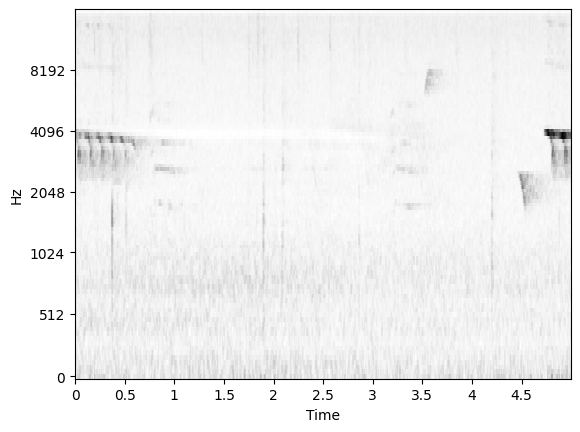

rank        : 0
source file : Recording_4/Recording_4_Segment_02.wav
offset_s    : 180.00
score       : 3.40


Button(description='Wood Thrush', style=ButtonStyle())

Button(description='Unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


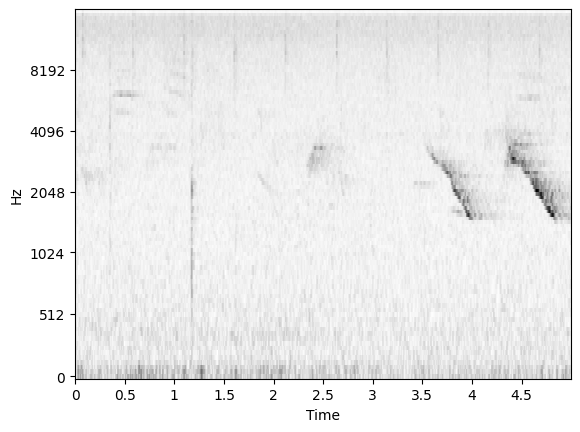

rank        : 1
source file : Recording_4/Recording_4_Segment_12.wav
offset_s    : 95.00
score       : 3.40


Button(description='Wood Thrush', style=ButtonStyle())

Button(description='Unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


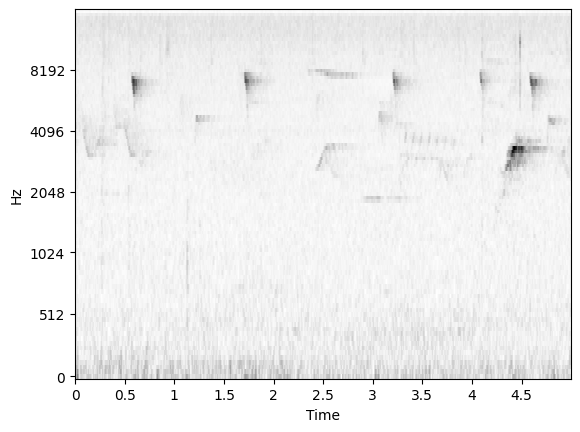

rank        : 2
source file : Recording_4/Recording_4_Segment_20.wav
offset_s    : 245.00
score       : 3.40


Button(description='Wood Thrush', style=ButtonStyle())

Button(description='Unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


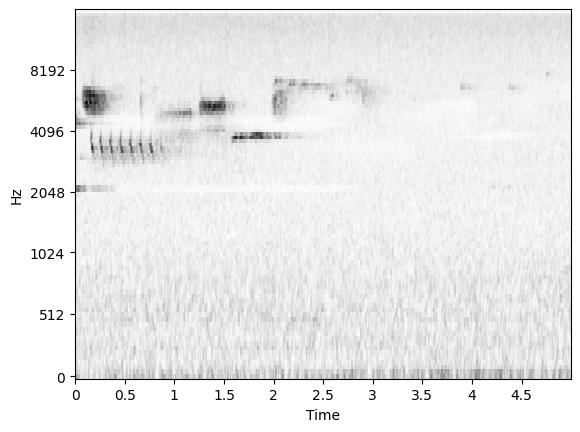

rank        : 3
source file : Recording_1/Recording_1_Segment_23.wav
offset_s    : 205.00
score       : 3.40


Button(description='Wood Thrush', style=ButtonStyle())

Button(description='Unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


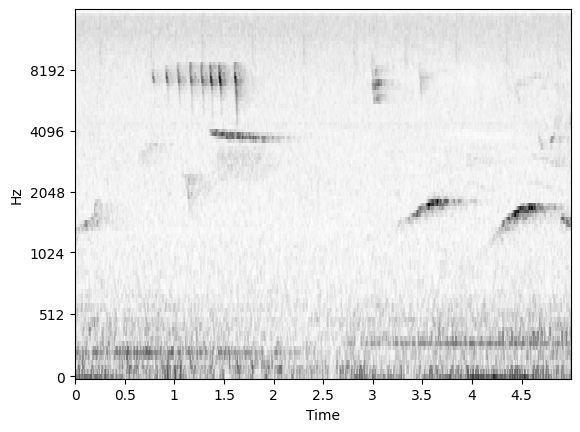

rank        : 4
source file : Recording_4/Recording_4_Segment_25.wav
offset_s    : 0.00
score       : 3.40


Button(description='Wood Thrush', style=ButtonStyle())

Button(description='Unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


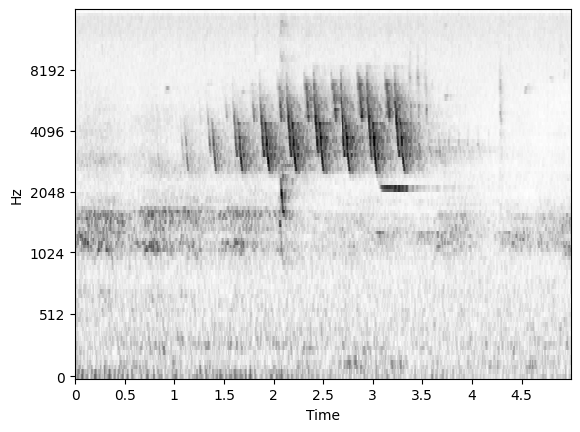

rank        : 5
source file : Recording_1/Recording_1_Segment_26.wav
offset_s    : 85.00
score       : 3.40


Button(description='Wood Thrush', style=ButtonStyle())

Button(description='Unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


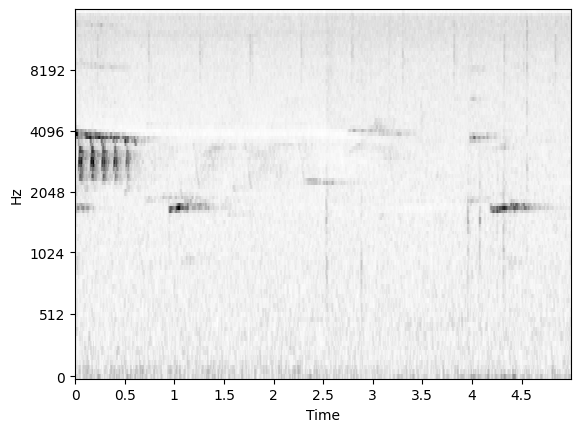

rank        : 6
source file : Recording_4/Recording_4_Segment_03.wav
offset_s    : 135.00
score       : 3.40


Button(description='Wood Thrush', style=ButtonStyle())

Button(description='Unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


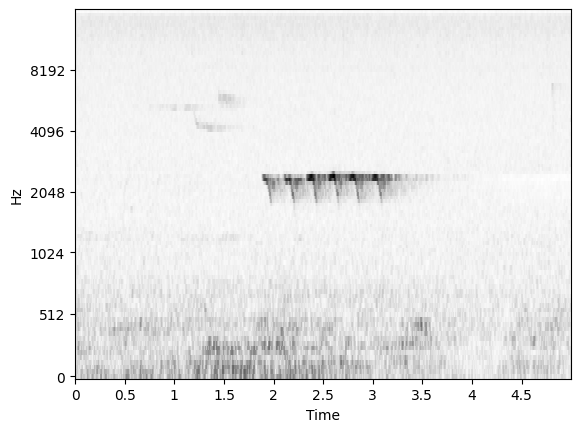

rank        : 7
source file : Recording_1/Recording_1_Segment_31.wav
offset_s    : 265.00
score       : 3.40


Button(description='Wood Thrush', style=ButtonStyle())

Button(description='Unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


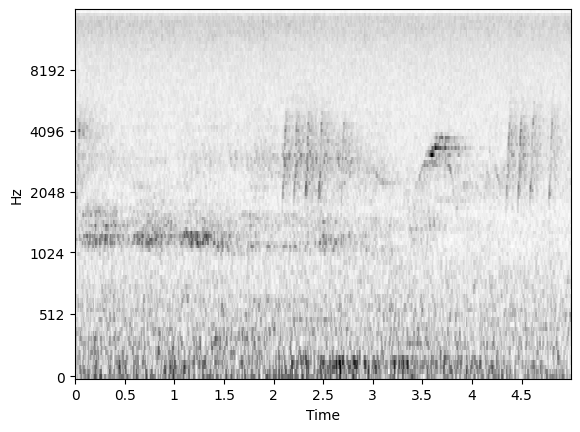

rank        : 8
source file : Recording_2/Recording_2_Segment_14.wav
offset_s    : 275.00
score       : 3.40


Button(description='Wood Thrush', style=ButtonStyle())

Button(description='Unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


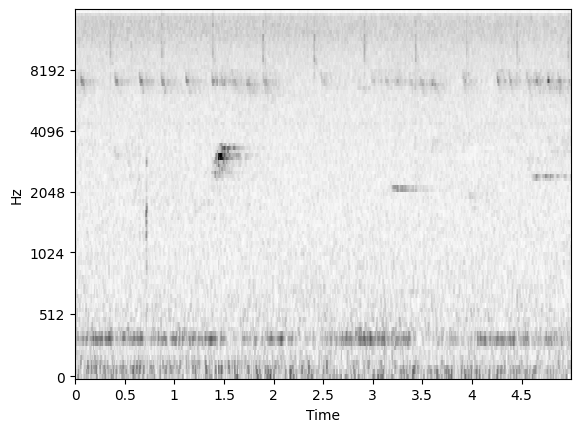

rank        : 9
source file : Recording_4/Recording_4_Segment_26.wav
offset_s    : 195.00
score       : 3.40


Button(description='Wood Thrush', style=ButtonStyle())

Button(description='Unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


In [37]:
# Display the search results for user labeling.
display.display_search_results(
    results, model_config.sample_rate, project_state.source_map,
    checkbox_labels=target_classes,
    max_workers=5)

### Write the user-annotated search results to file

This cell saves the annotations you generated in the previous step.  It writes data to the `labeled_data_path` location that was specified above.

In [38]:
def write_labeled_data(search_results, labeled_data_path: str, sample_rate: int):
  """Write labeled results to the labeled data collection."""
  labeled_data_path = epath.Path(labeled_data_path)
  counts = collections.defaultdict(int)
  duplicates = collections.defaultdict(int)
  for r in search_results:
    labels = [ch.description for ch in r.label_widgets if ch.value]
    if not labels:
      continue
    extension = epath.Path(r.filename).suffix
    filename = epath.Path(r.filename).name[: -len(extension)]
    output_filename = f'{filename}___{r.timestamp_offset}{extension}'
    for label in labels:
      output_path = labeled_data_path / label
      output_path.mkdir(parents=True, exist_ok=True)
      output_filepath = epath.Path(output_path / output_filename)
      if output_filepath.exists():
        duplicates[f'{label}'] += 1
        continue
      else:
        counts[label] += 1
      with output_filepath.open('wb') as f:
        wavfile.write(f, sample_rate, np.float32(r.audio))
  for label, count in counts.items():
    print(f'Wrote {count} examples for label {label}')
  for label, count in duplicates.items():
    print(f'Not saving {count} duplicates for label {label}')

write_labeled_data(results, labeled_data_path, model_config.sample_rate)

Wrote 9 examples for label Unknown
Wrote 1 examples for label Wood Thrush


### <a name=choosing-target-score></a>Choose a target score by plotting a histogram of all distances in the search corpus

During the top-k search step above, the Perch code also computed and saved the distances to *every* point in the search corpus.  The actual numerical values of these distances are hard to interpret, but the relative values are very useful.  In the following cell we plot a histogram of this set of distances to help us conceptualize the geometry of our embedded dataset.  This histogram helps us find and tune our values for the `target_score` variable in the top-k search.

A typical histogram will appear to fit some vaguely-normal looking distribution, possibly skewed left with a heavy tail.  While there is no prescriptive formula for finding useful values of `target_score`, the Perch team has found that good choices tend to lie near the left-hand 'hockey-stick' point of the distribution.  For example, in the following histogram, you might try playing with values somewhere in the range of 2.8 to 3.1:

![search](https://drive.google.com/uc?id=1bLc2XDTqutihg4wJSkCfB2DiT4Dpr4UO)

These tend to correspond to examples that are faint, or have background noise, or are otherwise not especially obvious.  Annotating these examples and adding them to the training set is very important because they help the linear model discriminate better on these less-clear "boundary" points.  

score < target_score percentage : 0.884


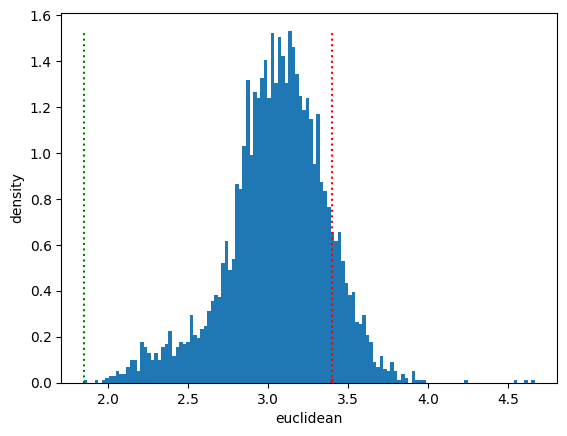

In [39]:
# Plot histogram of distances.
ys, _, _ = plt.hist(all_scores, bins=128, density=True)
hit_scores = [r.score for r in results.search_results]
plt.scatter(hit_scores, np.zeros_like(hit_scores), marker='|',
            color='r', alpha=0.5)

plt.xlabel(metric)
plt.ylabel('density')
if target_score is not None:
  plt.plot([target_score, target_score], [0.0, np.max(ys)], 'r:')
  # Compute the proportion of scores < target_score.
  hit_percentage = (all_scores < target_score).mean()
  print(f'score < target_score percentage : {hit_percentage:5.3f}')
min_score = np.min(all_scores)
plt.plot([min_score, min_score], [0.0, np.max(ys)], 'g:')

plt.show()

<a name=active-learning></a>
## Train a Linear Classifier

In the last stage, we labeled samples from the search dataset as matches (by similarity comparison with the queries) for each of our target classes. We will now train a simple linear model using those bootstrapped (labeled) data points from the search dataset.

**Important:** in order to be able to train the linear model, we need ~10-12 examples from each class, in our case 'Wood Thrush' and 'Unknown'. If you encounter an error in this section when training the model, you likely did not generate a sufficient amount of labeled data. Please go back to the [Top-k Search](#top-k-search) section and choose a new value of the `target_score` attribute.

In [40]:
# @title Load and embed the search-annotated dataset { vertical-output: true }

# Load the training data that is located in the `labeled_data_path` directory.
# In that directory there will be folders corresponding to our target labels

merged = data_lib.MergedDataset.from_folder_of_folders(
    base_dir=labeled_data_path,
    embedding_model=project_state.embedding_model,
    time_pooling='mean',
    load_audio=False,
    target_sample_rate=-2,
    audio_file_pattern='*',
    embedding_config_hash=bootstrap_config.embedding_config_hash(),
)

# Label distribution
lbl_counts = np.sum(merged.data['label_hot'], axis=0)
print('num classes :', (lbl_counts > 0).sum())
print('mean ex / class :', lbl_counts.sum() / (lbl_counts > 0).sum())
print('min ex / class :', (lbl_counts + (lbl_counts == 0) * 1e6).min())

Embedding from Folder of Folders...
Checking for existing embeddings from Folder of Folders...
Found 0 existing embeddings.
Checking for new sources to embed from Folder of Folders...


100%|██████████| 1/1 [00:00<00:00,  2.08it/s]


...embedded dataset in  4.84s...
    found 2 classes.
    class Unknown / 0 : 9
    class Wood Thrush / 1 : 1
num classes : 2
mean ex / class : 5.0
min ex / class : 1.0


### Train a simple linear model using the labeled embeddings

We use the following hyperparameters which should serve as reasonably performing defaults to train this linear model (classifier):

- `batch_size`: 12
- `num_epochs`: 128
- `num_hiddens`: -1 (to match the dimens of the embeddings)
- `learning_rate`: 0.001

Additionally, we compute the following metrics to measure the "goodness" of the trained model:
- `acc`: overall accuracy
- `auc_roc`: AUC ROC, or area under the receiving curve
- `cmAP`: mean average precision averaged across species
- `maps`: mean average precision for each class

In [41]:
# Number of random training examples to choose from each class.

# Note that if you don't have very many samples you'll need to set
# train_ratio=None and train_examples_per_class to a value that is
# less than the minimum number of examples you have of each class.

# Set exactly one of train_ratio and train_examples_per_class
train_ratio = None  #@param
train_examples_per_class = 5  #@param

# Number of random re-trainings. In other words, this value indicates how many
# models we will train.  By training multiple models, we get a sense of model
# robustness.  Training a single model (ie, num_seeds = 1) is sufficient for
# this tutorial, but feel free to bump this up to 4 or 12 to see the different
# characteristics of how the models perform.
num_seeds = 1  #@param

# Classifier training hyperparams.
# These should be good defaults.
batch_size = 12
num_epochs = 128
num_hiddens = -1
learning_rate = 1e-3

In [44]:
# This cell trains the linear model(s) and output some summary statistics for
# each model.  If you only have num_seeds = 1 then we'll only train a single
# model here.
metrics = collections.defaultdict(list)
for seed in tqdm.tqdm(range(num_seeds)):
  if num_hiddens > 0:
    model = classify.get_two_layer_model(
        num_hiddens, merged.embedding_dim, merged.num_classes)
  else:
    model = classify.get_linear_model(
        merged.embedding_dim, merged.num_classes)
  run_metrics = classify.train_embedding_model(
      model, merged, train_ratio, train_examples_per_class,
      num_epochs, seed, batch_size, learning_rate)
  metrics['acc'].append(run_metrics.top1_accuracy)
  metrics['auc_roc'].append(run_metrics.auc_roc)
  metrics['cmap'].append(run_metrics.cmap_value)
  metrics['maps'].append(run_metrics.class_maps)
  metrics['test_logits'].append(run_metrics.test_logits)

100%|██████████| 1/1 [00:01<00:00,  1.87s/it]


#### Compute the average metrics and print the model performance

In the previous cells, the `num_seeds` param controls how many times we train a model.  Each time we train a model there is some randomness in terms of which data points we choose from our labeled data, as well as some randomness in the model's initialization.  We can get a sense of how robust our classifier is by training multple times and looking at the summary statistics computed by the following cell.  A low `auc_roc` value (ie, less than 0.9 or so) probably indicates that we should generate some more training data.

In [45]:
mean_acc = np.mean(metrics['acc'])
mean_auc = np.mean(metrics['auc_roc'])
mean_cmap = np.mean(metrics['cmap'])
# Merge the test_logits into a single array.
test_logits = {
    k: np.concatenate([logits[k] for logits in metrics['test_logits']])
    for k in metrics['test_logits'][0].keys()
}

print(f'acc:{mean_acc:5.2f}, auc_roc:{mean_auc:5.2f}, cmap:{mean_cmap:5.2f}')
for lbl, auc in zip(merged.labels, run_metrics.class_maps):
  if np.isnan(auc):
    continue
  print(f'\n{lbl:8s}, auc_roc:{auc:5.2f}')
  colab_utils.prstats(f'test_logits({lbl})',
                      test_logits[merged.labels.index(lbl)])

acc: 0.75, auc_roc:  nan, cmap: 1.00


### The Active Learning Loop: Generating more training examples

It is possible, and even likely, that your first pass through the data yielded a model that could be improved, possibly with a low AUC-ROC, or poor performance in one particular class.  To improve the model, we need to generate additional interesting labeled examples from each class.  There are two ways we can proceed:

1. Go back to the audio search step and either use a new query example (if you have one), or play with the `target_score` param in the top-k search cell.
2. Now that we have trained a linear model, we can examine that model's outputs to help us surface new examples from th search corpus.

Both methods are perfectly reasonable, there is no right answer here!  If you'd like try the second method, proceed to the next cell.

### Generate new samples using logit scores

Most models output some notion of 'activation' per class, which can be thought of as some form of confidence score.  When you run a new sample through a model, the resulting activation value is called is a **logit**.  In the next cell we will surface new examples by looking for points in the search corpus that yield high logit scores for a given target class.  Intuitively, these are points that our linear model is very excited about, and therefore the resulting points are likely to be relevant to our task.

This method is similar to our top-k search method above.  We can input a `target_logit`, which will be used to surface points with a logit score that is close to the `target_logit`.  In a later cell, we show a histogram of all logit scores to indicate what the useful values of `target_logit` might be.  The first time through this cell, set `target_logit = None` to find matches with the highest logit.

Another good choice is `target_logit = 0.0`. This corresponds to the data where the model is most uncertain - labeling this data is a common active learning strategy called **margin sampling** and can help produce good models quickly.




In [46]:
# Choose the target class to work with.  This must be one of the values from the
# target_classes list above.
target_class = 'Wood Thrush'  #@param
# Choose a target logit; will display results close to the target.
# Set to None to get the highest-logit examples.
target_logit = None  #@param
# Number of results to display.
num_results = 10  #@param

# Create the embeddings dataset.
target_class_idx = merged.labels.index(target_class)
results, all_logits = search.classifer_search_embeddings_parallel(
    embeddings_classifier=model,
    target_index=target_class_idx,
    embeddings_dataset=embeddings_ds,
    hop_size_s=model_config.hop_size_s,
    target_score=target_logit,
    top_k=num_results
)

77it [00:00, 1539.36it/s]


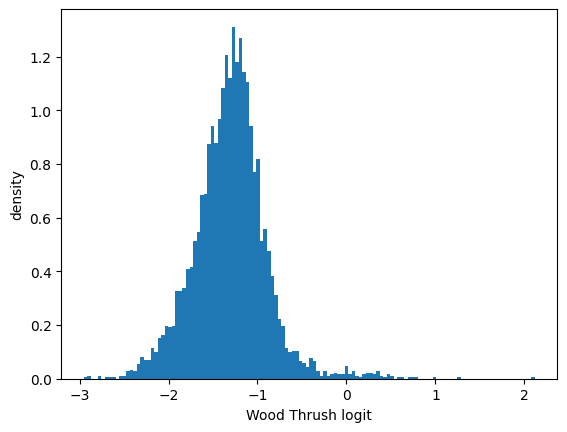

In [47]:
# Plot the histogram of model logits.
_, ys, _ = plt.hist(all_logits, bins=128, density=True)
plt.xlabel(f'{target_class} logit')
plt.ylabel('density')
# plt.yscale('log')
plt.plot([target_logit, target_logit], [0.0, np.max(ys)], 'r:')
plt.show()

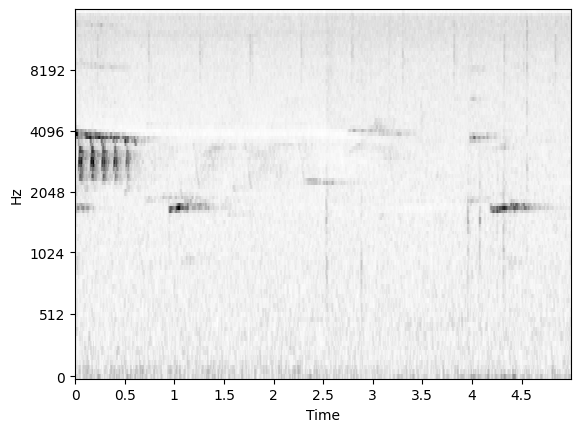

rank        : 0
source file : Recording_4/Recording_4_Segment_03.wav
offset_s    : 135.00
score       : 2.12


Button(description='Unknown', style=ButtonStyle())

Button(description='Wood Thrush', style=ButtonStyle())

--------------------------------------------------------------------------------


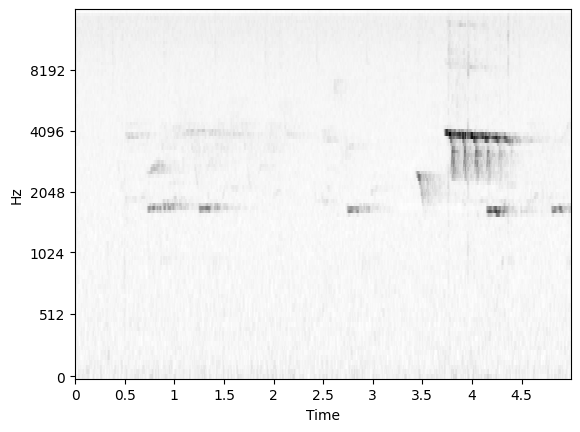

rank        : 1
source file : Recording_4/Recording_4_Segment_03.wav
offset_s    : 120.00
score       : 1.25


Button(description='Unknown', style=ButtonStyle())

Button(description='Wood Thrush', style=ButtonStyle())

--------------------------------------------------------------------------------


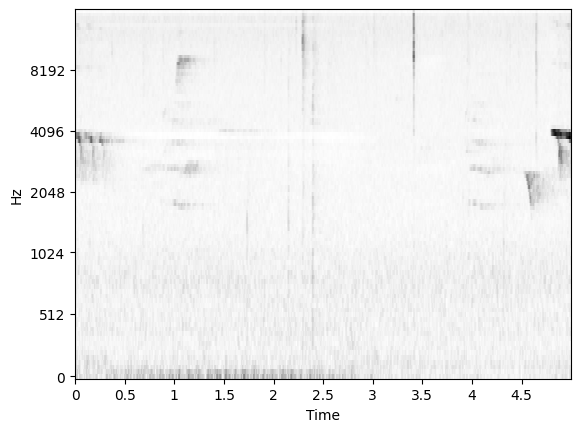

rank        : 2
source file : Recording_4/Recording_4_Segment_02.wav
offset_s    : 185.00
score       : 0.99


Button(description='Unknown', style=ButtonStyle())

Button(description='Wood Thrush', style=ButtonStyle())

--------------------------------------------------------------------------------


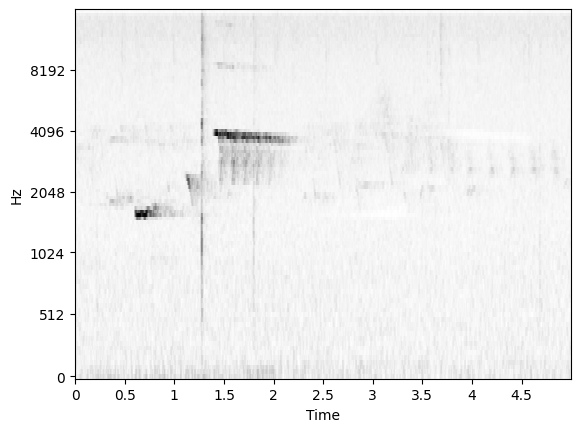

rank        : 3
source file : Recording_4/Recording_4_Segment_03.wav
offset_s    : 60.00
score       : 0.80


Button(description='Unknown', style=ButtonStyle())

Button(description='Wood Thrush', style=ButtonStyle())

--------------------------------------------------------------------------------


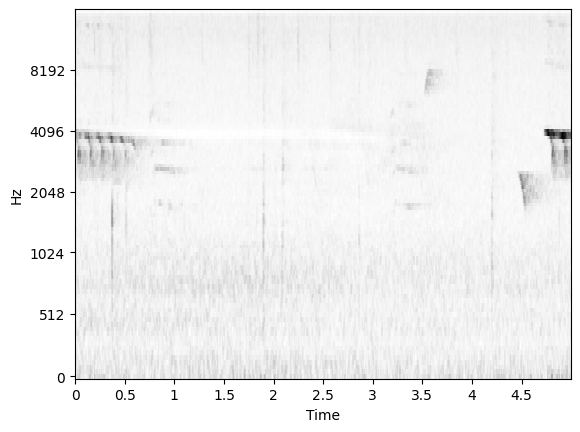

rank        : 4
source file : Recording_4/Recording_4_Segment_02.wav
offset_s    : 180.00
score       : 0.76


Button(description='Unknown', style=ButtonStyle())

Button(description='Wood Thrush', style=ButtonStyle())

--------------------------------------------------------------------------------


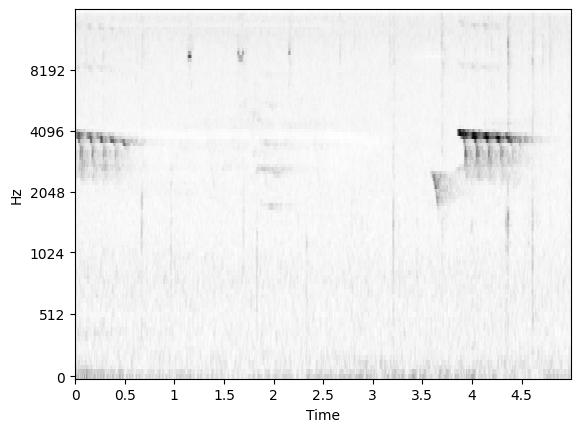

rank        : 5
source file : Recording_4/Recording_4_Segment_02.wav
offset_s    : 195.00
score       : 0.70


Button(description='Unknown', style=ButtonStyle())

Button(description='Wood Thrush', style=ButtonStyle())

--------------------------------------------------------------------------------


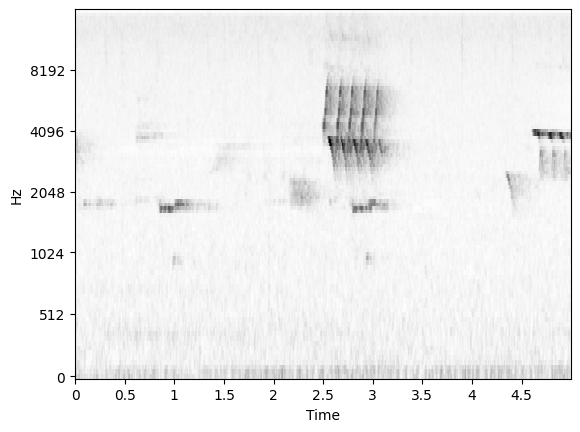

rank        : 6
source file : Recording_4/Recording_4_Segment_03.wav
offset_s    : 245.00
score       : 0.63


Button(description='Unknown', style=ButtonStyle())

Button(description='Wood Thrush', style=ButtonStyle())

--------------------------------------------------------------------------------


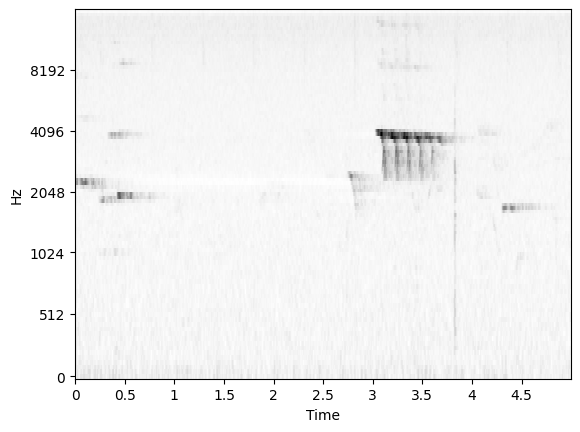

rank        : 7
source file : Recording_4/Recording_4_Segment_03.wav
offset_s    : 115.00
score       : 0.58


Button(description='Unknown', style=ButtonStyle())

Button(description='Wood Thrush', style=ButtonStyle())

--------------------------------------------------------------------------------


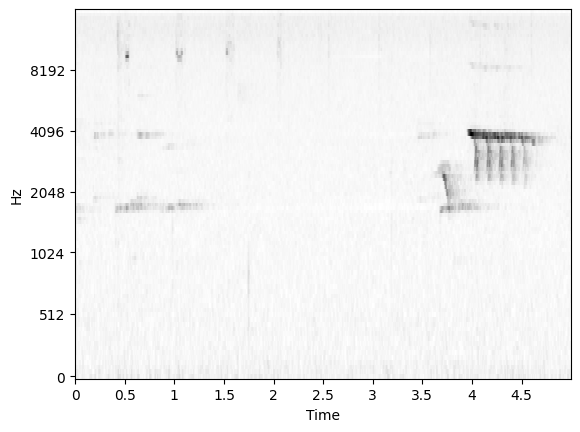

rank        : 8
source file : Recording_4/Recording_4_Segment_03.wav
offset_s    : 125.00
score       : 0.52


Button(description='Unknown', style=ButtonStyle())

Button(description='Wood Thrush', style=ButtonStyle())

--------------------------------------------------------------------------------


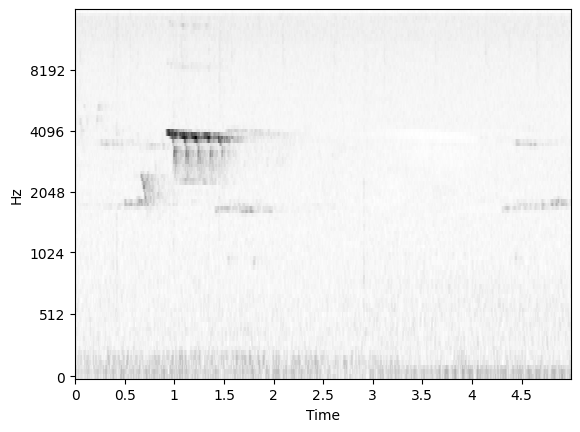

rank        : 9
source file : Recording_4/Recording_4_Segment_02.wav
offset_s    : 150.00
score       : 0.52


Button(description='Unknown', style=ButtonStyle())

Button(description='Wood Thrush', style=ButtonStyle())

--------------------------------------------------------------------------------


In [48]:
#@title Display results for the target label { vertical-output: true }

display_labels = merged.labels

extra_labels = []  #@param
for label in extra_labels:
  if label not in merged.labels:
    display_labels += (label,)
if 'Unknown' not in merged.labels:
  display_labels += ('Unknown',)

display.display_search_results(
    results, model_config.sample_rate,
    project_state.source_map,
    checkbox_labels=display_labels,
    max_workers=5)

#### Add selected results to the labeled data

As before, once we've annotated the examples from the previous cell, we'll save them in the `labeled_data_dir`.

In [49]:
results.write_labeled_data(labeled_data_path, model_config.sample_rate)

Wrote 9 examples for label Unknown
Wrote 1 examples for label Unknown exists


### Repeat!

We now have two distinct methods for generating training data.  Keep looping through those two methods and training new linear models until you have a model you're happy with (a high AUC-ROC score is a good indicator of model quality).

**Note:** If you want to start fresh, you can delete all of your previously labeled samples by going into your Google Drive and deleting all of the files and folders in the `labeled_data_dir`.

### Write the trained model's classification results (inference) to CSV

Usually the purpose of creating a model in the first place is to bulk-process many hours of raw audio.  In this cell, we'll run our linear model over the entire search corpus.  The output will be a CSV containing the results.  The `threshold` parameter is the minimum logit score that will get recorded (ie, samples with low logit scores are simply omitted from the results).  You can tune this score to generate different output CSVs at different confidence scores.

In [51]:
output_filepath

'/content/inference.csv'

In [52]:
# { vertical-output: true }

threshold = 1.0  #@param
output_filepath = '/Users/lviotti/Library/CloudStorage/Dropbox/Work/Kitzes/projects/active-learning-nb/CCAI 2023 Google Perch Tutorial Outputs/content/inference.csv'  #@param

def classify_batch(batch):
  """Classify a batch of embeddings."""
  emb = batch[tf_examples.EMBEDDING]
  emb_shape = tf.shape(emb)
  flat_emb = tf.reshape(emb, [-1, emb_shape[-1]])
  logits = model(flat_emb)
  logits = tf.reshape(
      logits, [emb_shape[0], emb_shape[1], tf.shape(logits)[-1]])
  # Take the maximum logit over channels.
  logits = tf.reduce_max(logits, axis=-2)
  batch['logits'] = logits
  return batch


inference_ds = embeddings_ds.map(
    classify_batch, num_parallel_calls=tf.data.AUTOTUNE
)
all_embeddings = []
all_logits = []

with open(output_filepath, 'w') as f:
  # Write column headers.
  headers = ['filename', 'timestamp_s', 'label', 'logit']
  f.write(', '.join(headers) + '\n')
  for ex in tqdm.tqdm(inference_ds.as_numpy_iterator()):
    all_embeddings.append(ex['embedding'])
    all_logits.append(ex['logits'])
    for t in range(ex['logits'].shape[0]):
      for i, label in enumerate(merged.labels):
        if ex['logits'][t, i] > threshold:
          offset = ex['timestamp_s'] + t * model_config.hop_size_s

          logit = '{:.2f}'.format(ex['logits'][t, i])
          row = [ex['filename'].decode('utf-8'),
                 '{:.2f}'.format(offset),
                 label, logit]
          f.write(', '.join(row) + '\n')

all_embeddings = np.concatenate(all_embeddings, axis=0)
all_logits = np.concatenate(all_logits, axis=0)

77it [00:00, 2079.68it/s]


## Visualization of results

We will now use [t-SNE](https://en.wikipedia.org/wiki/T-distributed_stochastic_neighbor_embedding) to produce a scatter plot of all of the embeddings.
t-SNE is a technique for reducing high-dimensional data to two dimensions
for visualization. It tries to keep points which are close in the embedding
space close in the two-dimensional space.

We will also use the output probabilities from the classifier to color the
resulting scatter plot.

CPU times: user 49 s, sys: 26.8 s, total: 1min 15s
Wall time: 6.87 s


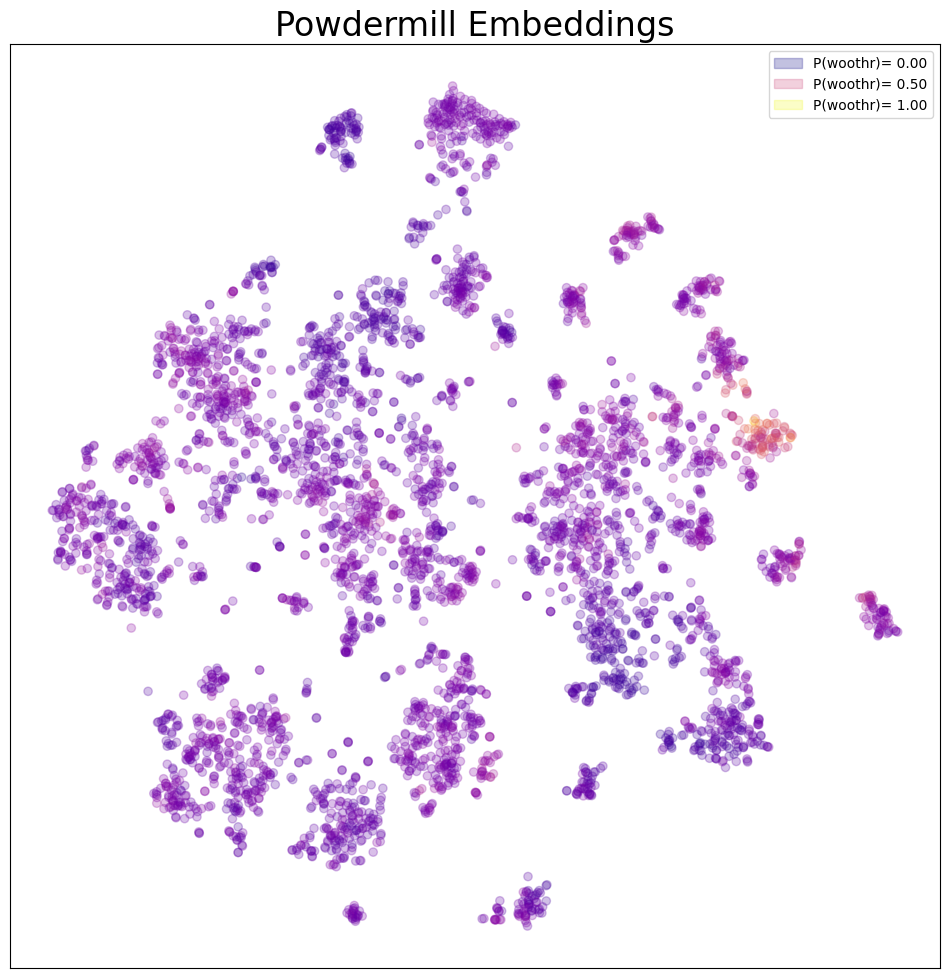

In [53]:
# { vertical-output: true }

import sklearn
from sklearn.manifold import TSNE
import matplotlib.patches as mpatches
from matplotlib import colormaps

def sigmoid(x):
  return 1 / (1 + np.exp(-x))

pca = sklearn.decomposition.PCA(256)
reduced = pca.fit_transform(all_embeddings.squeeze())
tsne = TSNE()
%time ts = tsne.fit_transform(reduced)

# Plot the t-SNE embedding.
plt.figure(figsize=(12,12))
plt.title('Powdermill Embeddings', fontsize=24)
plt.xticks([]),plt.yticks([])
cmap = colormaps['plasma']
cs = cmap(sigmoid(all_logits[:, 1]))
plt.scatter(ts[:, 0], ts[:, 1], c=cs, alpha=0.25, marker='o')

patches = []
for i, pr in enumerate((0.0, 0.5, 1.0)):
  patch = mpatches.Patch(color=cmap(pr), label=f'P(woothr)={pr:5.2f}', alpha=0.25)
  patches.append(patch)
plt.legend(handles=patches)

<a name="discussion"></a>
# Discussion

This pipeline provides end-to-end annotation of a large unlabeled dataset based on a particular class (in our case, a species) of interest. To recap, we processed an unlabeled soundscape dataset through user-in-the-loop active learning to produce windowed annotations, and concluded by writing the annotated data to CSV. This allows for a variety of downstream analysis and visualization.

## Limitations

We have found that this methodology works well with a wide range of bioacoustic signals, as detailed in “Feature Embeddings from Large-Scale Acoustic Bird Classifiers Enable Few-Shot Transfer Learning” (https://arxiv.org/abs/2307.06292). However, there are undoubtedly limits on what the bird embeddings can achieve. In these cases, using a different embedding model may help capture features relevant to your task. We have also found that in some cases applying audio separation helps retrieval, which in turn can lead to better training data for the classification step.

## Next Directions

If you would like to apply these methods to your own audio dataset, the tools here should provide enough guidance to get started! For large datasets, you will want to use a GPU to compute the embeddings. And for very large datasets, we provide tooling for processing audio into embeddings with Apache Beam + Dataflow on GCP.


If you would like to try a different embedding model, our main codebase provides tools to do so. We provide an abstract EmbeddingModel class, which allows us to use any model that can turn a window of audio into an embedding.


There are a wide variety of problems to consider in this space!

* Detection of specific call types for a species,
* Classifying adult/juvenile calls,
* Tracking changes in vocalization patterns over time and geography,
* Tracking the impact of anthropogenic noise on an ecosystem,
* Broad biodiversity measurements,
* Directly classifying 'ecosystem health' from audio samples.

And more! Really, the only limit is your imagination!


# References

Perch [opensourced codebase](https://github.com/google-research/perch)

Open-sourced Datasets:
*    [Xeno-Canto](https://xeno-canto.org/)
*    [Powdermill Soundscape dataset](https://zenodo.org/record/4656848#.Y7ijhOxudhE)

Pre-trained embedding model for other transfer learning tasks:
*    [Bird Vocalization Classifier v4](https://tfhub.dev/google/bird-vocalization-classifier/4)

Related research:
* "Feature Embeddings from Large-Scale Acoustic Bird Classifiers Enable Few-Shot Transfer Learning" ([arXiv](https://arxiv.org/abs/2307.06292))
* "Agile Modeling: From Concept to Classifier in Minutes" ([arXiv](https://arxiv.org/abs/2302.12948))